# Deep Dive 2 in GBSV (Grundlagen der Bild- und Signalverarbeitung)

J. Hartmann, S. Suter

This is the second of two deep dives in the module GBSV.

Today we are delving into correlations, thresholding, morphological operations, and the intriguing realm of keypoints and feature descriptors.
With the help of these topics we get to understand signals as well as images better and are able to compare images with each other.

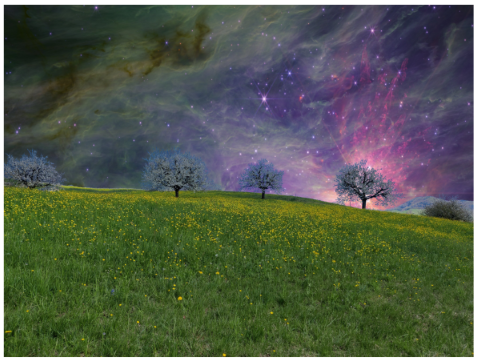 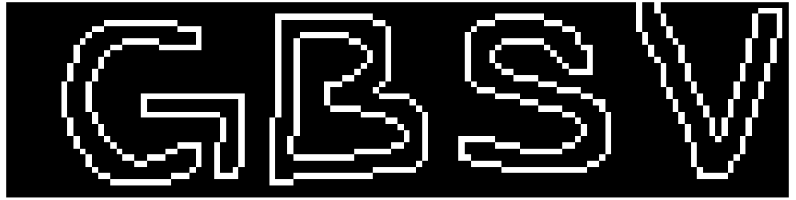

# Imports

In [178]:
import cv2 as cv
from enum import Enum
from ipywidgets import interact, widgets
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from skimage import morphology
from scipy import signal
from scipy import datasets
import statsmodels.api as sm
import statsmodels 

# Correlations
Correlations are used to measure linear relationships and similarities between two signals or images.
Correlation enables us to detect patterns and to correctly align two signals with each other.
Common use cases are image matching, pattern recognition, signal analysis, etc.

The calculation is similar to the application of filters as we have seen in deep dive 1 and can be applied to 1D (e.g., signals), 2D (e.g., images) or even data of higher dimensionality.

In the following we look at correlations from the signal side. There exist two different ways of calculating correlations.

* One type of frequently used correlation analysis is **auto-correlation**. In auto-correlation, we compare the signal with itself in order to gain knowledge about the signal. We can find out whether there exist patterns in the signal such as trends or seasonality.

* Another type of correlation is the **cross-correlation**. With the cross-correlation two signals are compared to each other in order to find similarities between the signals. This can be used for pattern recognition. 


## Auto-Correlation

Auto-correlation is the correlation between two values in a signal. For example, the correlation of a signal can be analyzed with itself. The linear relationship is measured between lagged values of a series y to find any relationships.

In the context of calculating correlations, a **lag** is a fixed period of time by which a signal gets shifted. This shifting of a pattern, referred to as *lagged*, essentially means delaying the signal by a certain number of time steps. In doing so, we can measure the correlation between the signal and its own past values. When computing auto-correlation, the 'lag' is defined as the interval between the signal and a delayed version of itself. Often, this process is repeated for multiple lags to obtain a deeper understanding of temporal dependencies within the signal

**[Auto-Correlation-Formula](https://real-statistics.com/time-series-analysis/stochastic-processes/autocorrelation-function/)**

Mean of the series $y_1, ..., y_n$:
$$\bar{y} = \frac{1}{n} \sum_{i=1}^{n} y_i $$

The **auto-covariance function** at lag $k$, for $k >= 0$, of the time series
$$c_k = \frac{1}{n} \sum_{t=k+1}^{n} (y_{t} - \bar{y})(y_{t-k}-\bar{y})$$
The **auto-correlation function (ACF)** at lag $k$, for $k>=0$, of the time series
$$r_k = \frac{c_k}{c_0}$$ 

An auto-correlation of **+1** means perfect positive correlation and **-1** a perfect negative correlation.  


**Helpful links:**
* https://www.investopedia.com/terms/a/autocorrelation.asp
* https://machinelearningmastery.com/gentle-introduction-autocorrelation-partial-autocorrelation/
* https://statisticsbyjim.com/time-series/autocorrelation-partial-autocorrelation/

In the following we want to see the auto-correlation function (ACF) on an example.

For this we load a **temperature dataset** from the **Australian Bureau of Meteorology**. This dataset can be downloaded from [this blog of Jason Brownlee](https://machinelearningmastery.com/gentle-introduction-autocorrelation-partial-autocorrelation/) and is also available in the structure of this deep dive.

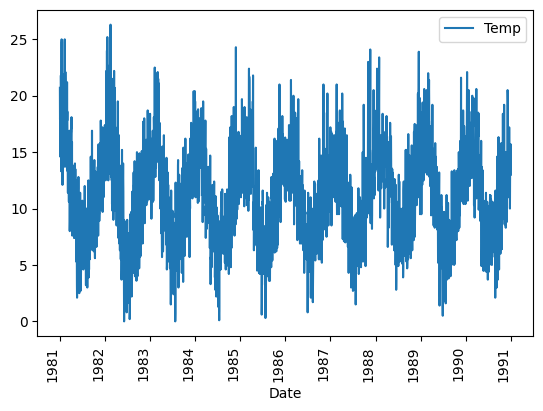

In [179]:
temperature_data = pd.read_csv("Data/Minimum_Daily_Temperatures_Dataset.csv", header=0, index_col=0)
temperature_data.index =  pd.to_datetime(temperature_data.index, format='%Y-%m-%d')
temperature_data[:].plot()
plt.xticks(rotation=90)
plt.show()

#### <font color='blue'>Exercise:</font>
* What characteristics can be seen in this series of temperature data?
    - Repeating Pattern
    - One Year

* Are there any observable temperature patterns?
    - periodicity
    - seasonality

Now we apply the ACF from **statsmodels** onto the data:

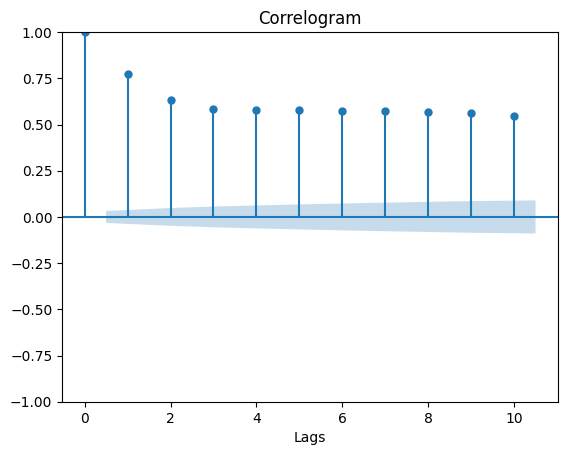

In [180]:
# Apply auto-correlation
### BEGIN SOLUTION
lags = 10
### END SOLUTION

sm.graphics.tsa.plot_acf(temperature_data, lags=lags, title="Correlogram")
plt.xlabel("Lags")
plt.show()

In this plot the correlogram (the result of the auto-correlation of our temperature dataset) is plotted.

It is important to notice that these are not plotted areas, each lag has its own value!

Below the plot a light blue area is plotted. By this the 95% confidence interval is marked assuming that the time series is white noise.

#### <font color='blue'>Exercise:</font>
Try to solve the following questions by changing the lags variable in the cell above. Discuss in groups or with your neighbor.
* What unit does the lag represent?
* For which lag is the correlation value 1.0?
* Why are there positive and negative values in the correlation plot?
* How is the correlation changing over the lags? Why?

### Auto-Correlations Example 2
We've previously examined data with seasonal patterns. Now, we'll create a new time series and see how its auto-correlation correlogram differs.

In [181]:
mean = 0
std = 80 
num_samples = 1000
series = np.random.normal(mean, std, size=num_samples) - np.arange(num_samples)

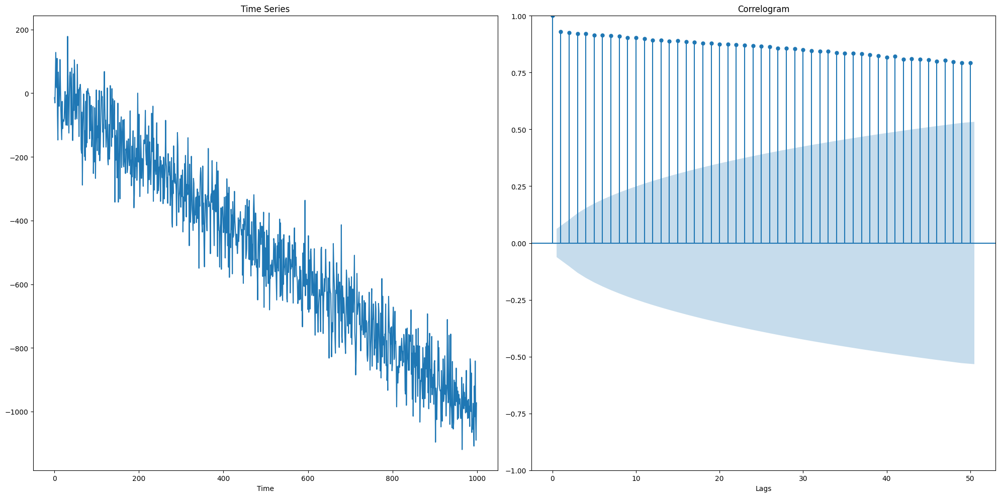

In [182]:
fig, ax = plt.subplots(1, 2, figsize=(20,10))
ax[0].plot(series)
ax[0].set_title("Time Series")
ax[0].set_xlabel("Time")

### BEGIN SOLUTION
lags = 50
### END SOLUTION

sm.graphics.tsa.plot_acf(series, lags=lags, title="Correlogram", ax=ax[1])
ax[1].set_xlabel("Lags")
plt.tight_layout()
plt.show()

#### <font color='blue'>Exercise:</font>
Discuss:
* What are the characteristics of this time series
    - linear ascending trend
    - noise around the trend
    - no seasonality
    - no periodicity
* How are the correlations changing over the different lags in this plot?
    - decreasing
    - below 0 after approx. 390
    - the more lags the bigger the confidence interval
* What can be interpreted based on this correlogram?
    - 

#### <font color='blue'>Exercise:</font>
* Generate a time series that is white noise:
    * What are the properties of this new time series?
    * How does the correlogram looks like for only white noise?
* Generate or download another time series and generate the correlogram.

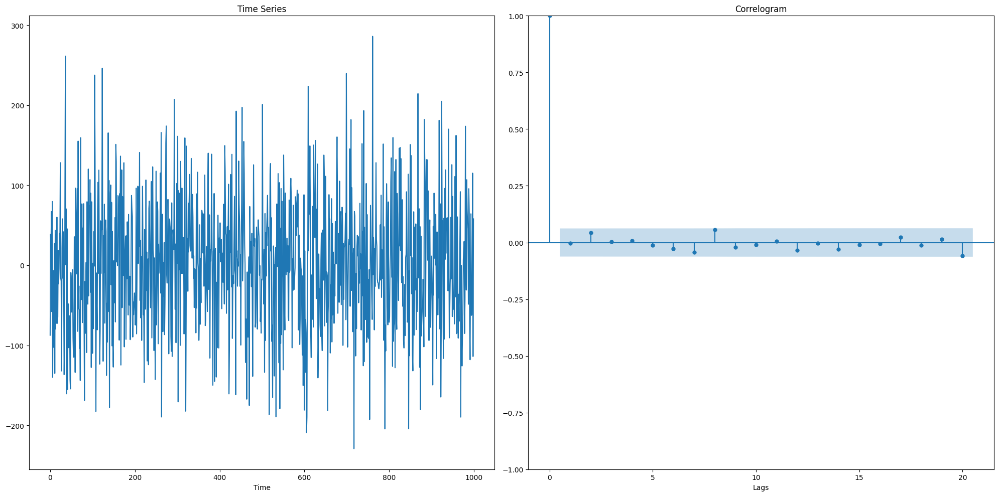

In [183]:
### BEGIN SOLUTION
mean = 0
std = 80
num_samples = 1000
series = np.random.normal(mean, std, size=num_samples)
### END SOLUTION

fig, ax = plt.subplots(1, 2, figsize=(20,10))
ax[0].plot(series)
ax[0].set_title("Time Series")
ax[0].set_xlabel("Time")

### BEGIN SOLUTION
lags = 20
### END SOLUTION

sm.graphics.tsa.plot_acf(series, lags=lags, title="Correlogram", ax=ax[1])
ax[1].set_xlabel("Lags")
plt.tight_layout()
plt.show()

## Cross-Correlation
Now, let's change our focus to cross-correlation. Unlike auto-correlation, where we analyze the correlation of a signal with itself shifted in time, cross-correlation seeks to examine the correlation between two different signals. 

Despite these different applications of auto- and cross-correlation, the calculation of cross-correlation follows the same mathematical process as auto-correlation. This statistical tool enables us to compare and decipher how much one signal resembles another, by taking into account various shifts in time. It is particularly useful in finding signal similarities, and it plays an essential role in signal processing and time series analysis.

In this deep dive we illustrate cross-correlation on 2D images, aiming to locate a small section of an image within the larger image. To do this, we'll load an image and crop a selected region-of-interest (ROI) from it.

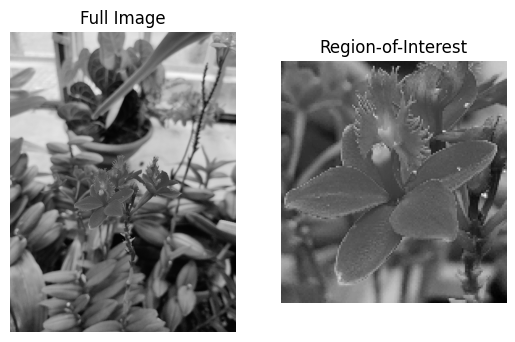

In [184]:
image = cv.imread('Images/flower_1.jpg', cv.IMREAD_GRAYSCALE)
image = cv.resize(image, (image.shape[1]//6, image.shape[0]//6))
roi = image[300:450, 140:280]

fig, axs = plt.subplots(1, 2)
axs[0].imshow(image, cmap='gray')
axs[0].axis('off')
axs[0].set_title("Full Image")

axs[1].imshow(roi, cmap='gray')
axs[1].axis('off')
axs[1].set_title("Region-of-Interest")

plt.show()

Now, we try to locate the ROI in the image using cross-correlation.
For this we center the values of the ROI around zero. Then, we can calculate the 2D cross-correlation and plot the result.

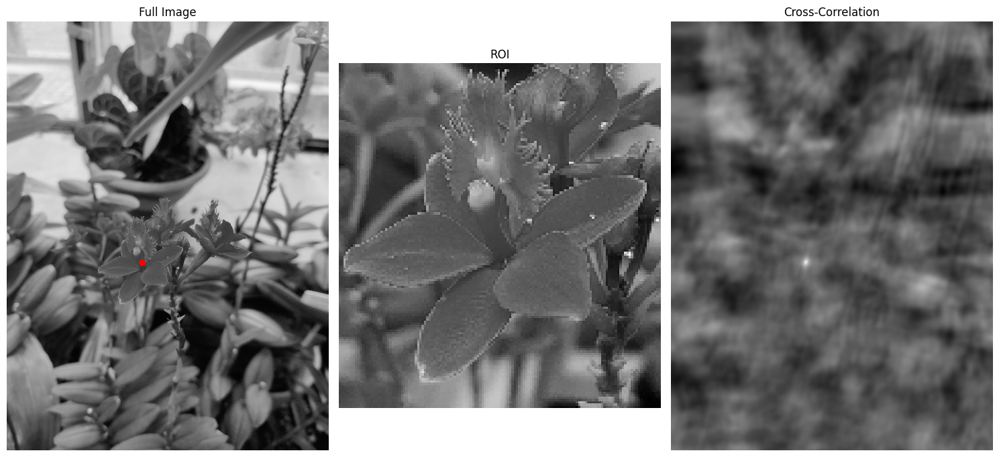

In [185]:
roi_centered = roi - roi.mean()
corr = signal.correlate2d(image, roi_centered, boundary='symm', mode='same')
y, x = np.unravel_index(np.argmax(corr), corr.shape)  # find the match

# Plot the Result
fig, (ax_orig, ax_template, ax_corr) = plt.subplots(1, 3, figsize=(15, 15))
ax_orig.imshow(image, cmap='gray')
ax_orig.set_title('Full Image')

ax_orig.set_axis_off()
ax_template.imshow(roi_centered, cmap='gray')
ax_template.set_title('ROI')

ax_template.set_axis_off()
ax_corr.imshow(corr, cmap='gray')
ax_corr.set_title('Cross-Correlation')

ax_corr.set_axis_off()
ax_orig.plot(x, y, 'ro')

plt.tight_layout()
plt.show()

#### <font color='blue'>Exercise:</font>
* Try different ROIs of the image. Is it possible for the cross-correlation to find the origin of all chosen ROIs? Do you find samples where it does not work?
* How can be said where the ROI comes from based on cross-correlation?
* What happens, when the cropped ROI is not centered around zero?

#### <font color='blue'>Exercise:</font>
* Try to add noise to the image. Is cross-correlation noise resistent? Why? Why not? For what types of noise?

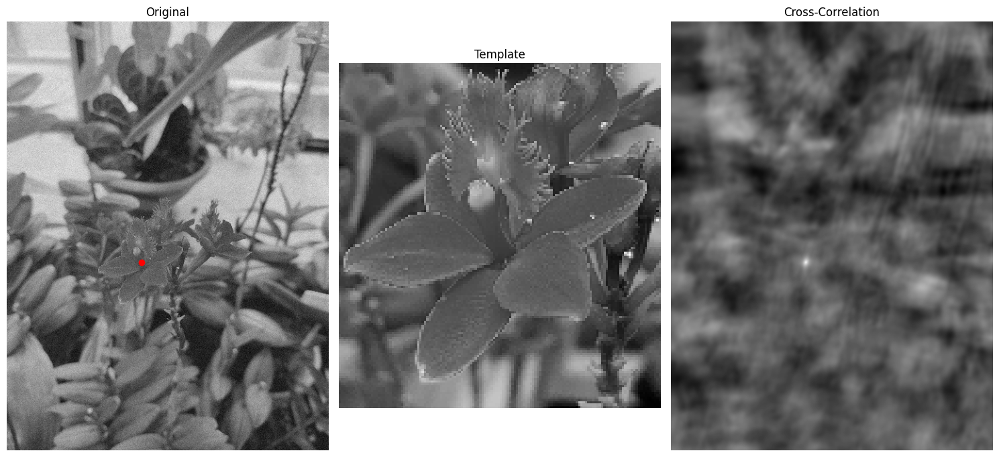

In [186]:
roi_centered = roi - roi.mean()
### BEGIN SOLUTION
image_noised = image + np.random.normal(0, 10, size=image.shape)
### END SOLUTION
corr = signal.correlate2d(image_noised, roi_centered, boundary='symm', mode='same')
y, x = np.unravel_index(np.argmax(corr), corr.shape)  # find the match

# Plot the Result
fig, (ax_orig, ax_template, ax_corr) = plt.subplots(1, 3, figsize=(15, 15))
ax_orig.imshow(image_noised, cmap='gray')
ax_orig.set_title('Original')
ax_orig.set_axis_off()
ax_template.imshow(roi_centered, cmap='gray')
ax_template.set_title('Template')
ax_template.set_axis_off()
ax_corr.imshow(corr, cmap='gray')
ax_corr.set_title('Cross-Correlation')
ax_corr.set_axis_off()
ax_orig.plot(x, y, 'ro')
plt.tight_layout()
plt.show()

# Thresholding for Image Segmentation

For image segmentation, thresholding is a frequently-used simple technique where pixel values in an image are set to a predefined value based on a criterion. For example, for a grayscale image, all pixels above or below a certain threshold are set to one color value, e.g., white; while the other values are set to another color, e.g., black. The result is a binary segmentation map where objects of interest are segmented from their background. While this technique is often applied to  grayscale images, it works as well for color images. E.g., using channel-wise thresholdig or color-space transformations.

Let's look at a simple example of a nature image:

In [187]:
def plot_image(image):
    plt.imshow(image, cmap='gray')
    plt.axis('off')
    plt.show()

def plot_images(image1: np.ndarray, image2: np.ndarray, cmap: str = 'gray', titles: list[str] = None):
    fig, ax = plt.subplots(1, 2, figsize=(20,10))
    ax[0].imshow(image1, cmap=cmap)
    ax[0].axis('off')
    ax[1].imshow(image2, cmap=cmap)
    ax[1].axis('off')

    if titles is not None:
        for idx, title in enumerate(titles):
            ax[idx].set_title(title)
    plt.tight_layout()
    plt.show()

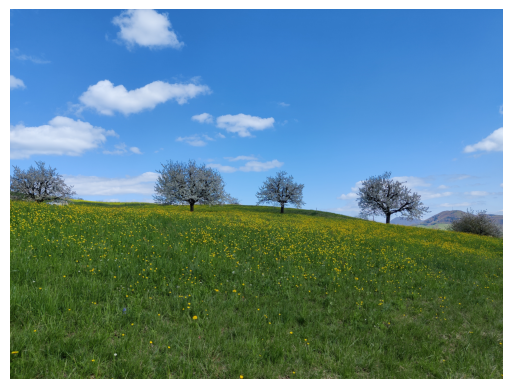

In [188]:
blue_sky = cv.imread('Images/nature.jpg')
blue_sky = cv.cvtColor(blue_sky, cv.COLOR_BGR2RGB)
plot_image(blue_sky)

In this nature image, we segment the blue sky from the rest of the image by thresholding. For this task, an example threshold of 230 was taken on the second (blue) channel of the image to illustrate the sky segmenation. In the image right to the original, the segmented values are colord in green.

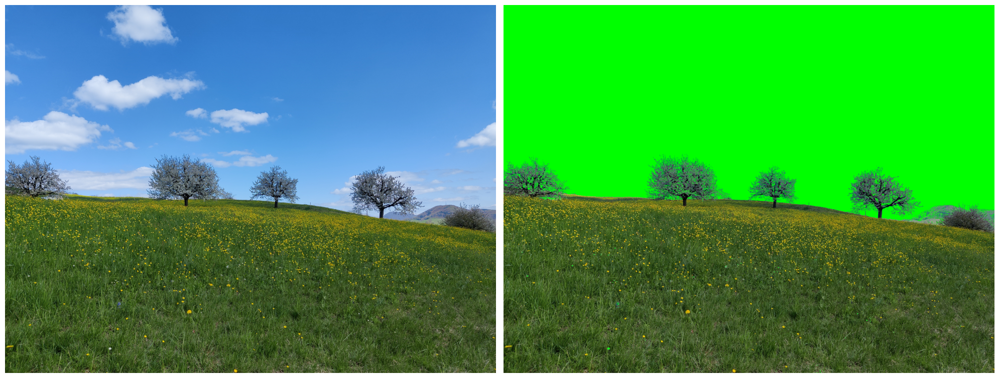

In [189]:
# Filter Image
### BEGIN SOLUTION
filter_value = 150
### END SOLUTION

image_filtered = blue_sky.copy()
image_filtered[blue_sky[:,:,2] > filter_value] = [0,255,0]

plot_images(blue_sky, image_filtered)

#### <font color='blue'>Exercise:</font>
- Try different values for ```filter_value``` and experience how the filtered area is affected. With which value can the blue sky completely be erased?

In [190]:
image = cv.imread('Images/nature.jpg')
image = cv.cvtColor(image, cv.COLOR_BGR2RGB)

# Create a function for interactive visualization
def visualize_filter(red_slider_val, green_slider_val, blue_slider_val,
                    bigger_red, bigger_green, bigger_blue):
    filtered_image = image.copy()
    
    if bigger_red:
        filter_r = filtered_image[:, :, 0] > red_slider_val
    else:
        filter_r = filtered_image[:, :, 0] < red_slider_val

    if bigger_green:
        filter_g = filtered_image[:, :, 1] > green_slider_val
    else:
        filter_g = filtered_image[:, :, 1] < green_slider_val

    if bigger_blue:
        filter_b = filtered_image[:, :, 2] > blue_slider_val
    else:
        filter_b = filtered_image[:, :, 2] < blue_slider_val
        
    filter = filter_r & filter_g & filter_b
  
    filtered_image[filter] = [0,255,0]
    plt.imshow(filtered_image)
    plt.show()

red_slider = widgets.IntSlider(value=150, min=0, max=255, step=1, description='Slider Red')
green_slider = widgets.IntSlider(value=150, min=0, max=255, step=1, description='Slider Green')
blue_slider = widgets.IntSlider(value=150, min=0, max=255, step=1, description='Slider Blue')

bigger_than_red = widgets.Checkbox(value=False, description='Greater Than Red')
bigger_than_green = widgets.Checkbox(value=False, description='Greater Than Green')
bigger_than_blue = widgets.Checkbox(value=False, description='Greater Than Blue')

# Create the interactive widget
out = widgets.interactive_output(visualize_filter, {'red_slider_val':red_slider, 'green_slider_val':green_slider, 'blue_slider_val':blue_slider,
                                                    'bigger_red':bigger_than_red, 'bigger_green':bigger_than_green, 'bigger_blue':bigger_than_blue})

display(red_slider, green_slider, blue_slider, bigger_than_red, bigger_than_green, bigger_than_blue, out )

IntSlider(value=150, description='Slider Red', max=255)

IntSlider(value=150, description='Slider Green', max=255)

IntSlider(value=150, description='Slider Blue', max=255)

Checkbox(value=False, description='Greater Than Red')

Checkbox(value=False, description='Greater Than Green')

Checkbox(value=False, description='Greater Than Blue')

Output()

#### <font color='blue'>Exercise:</font>
- Try to find a more complex theshold that does not remove the clouds! (You can try out parts of the filter with this widget above)

Now as we segmented the sky, we replace this sky by another image.

In [191]:
james_webb = cv.imread('Images/JamesWebbImage.jpg') # NASA, ESA, CSA / Science leads and image processing: M. McCaughrean, S. Pearson, CC BY-SA 3.0 IGO 
james_webb = cv.cvtColor(james_webb, cv.COLOR_BGR2RGB)
james_webb = james_webb[:blue_sky.shape[0], :blue_sky.shape[1]]




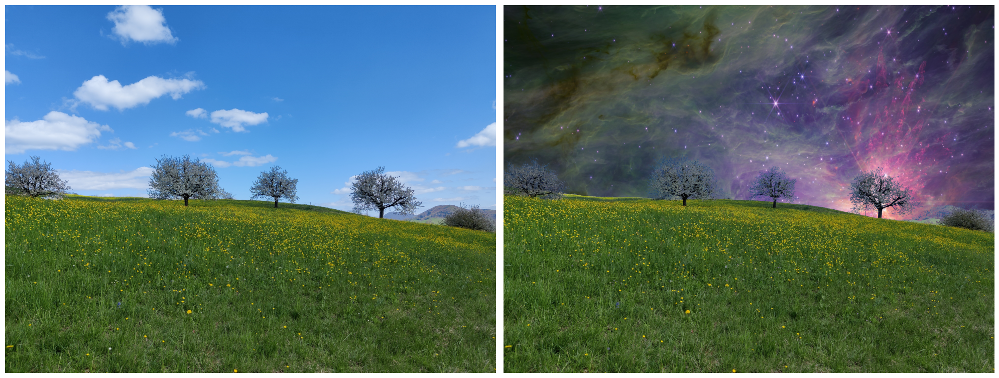

In [192]:
image_filtered = blue_sky.copy()
filter = blue_sky[:,:,2] > filter_value
image_filtered[filter] = james_webb[filter]
plot_images(blue_sky, image_filtered)

And now your creativity is required:

#### <font color='blue'>Group Competition:</font>
Try in groups of 2-3 people to create the funniest picture based on thresholding/segmentation (analogous to the above example). 
For this you can use the image ```Letters.jpg``` as a basis or take your own ones. There are no limitations on creativity; only technical constraints specify the use of thresholding/segmentation.

Send your final image to julia.hartmann@fhnw.ch and you all can vote for the most creative masterpiece. Good luck! 🙂

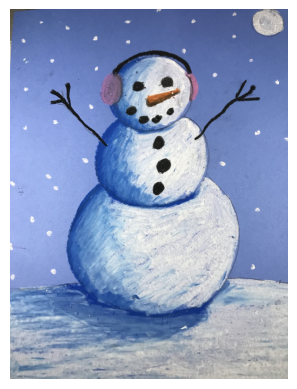

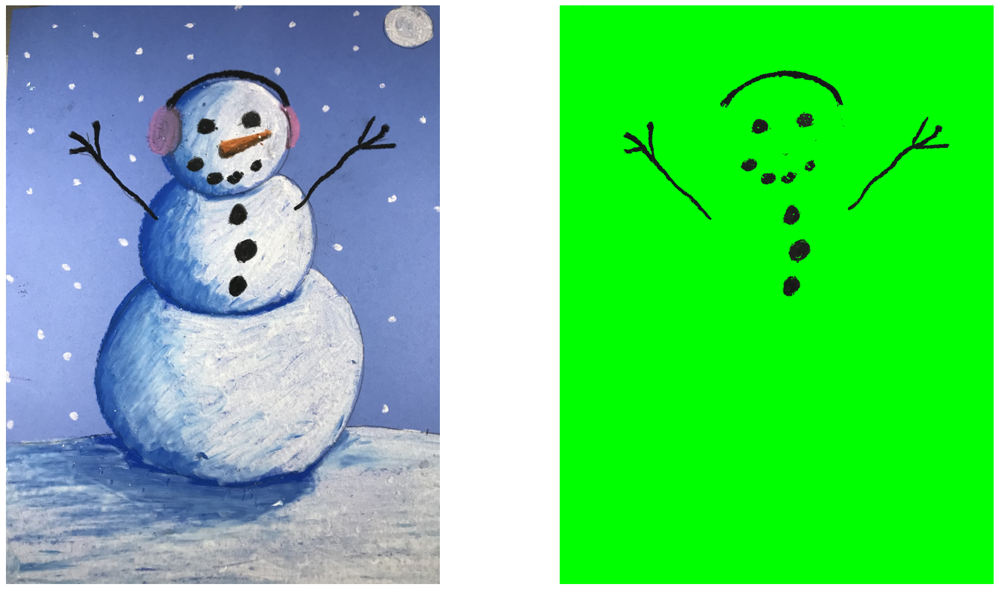

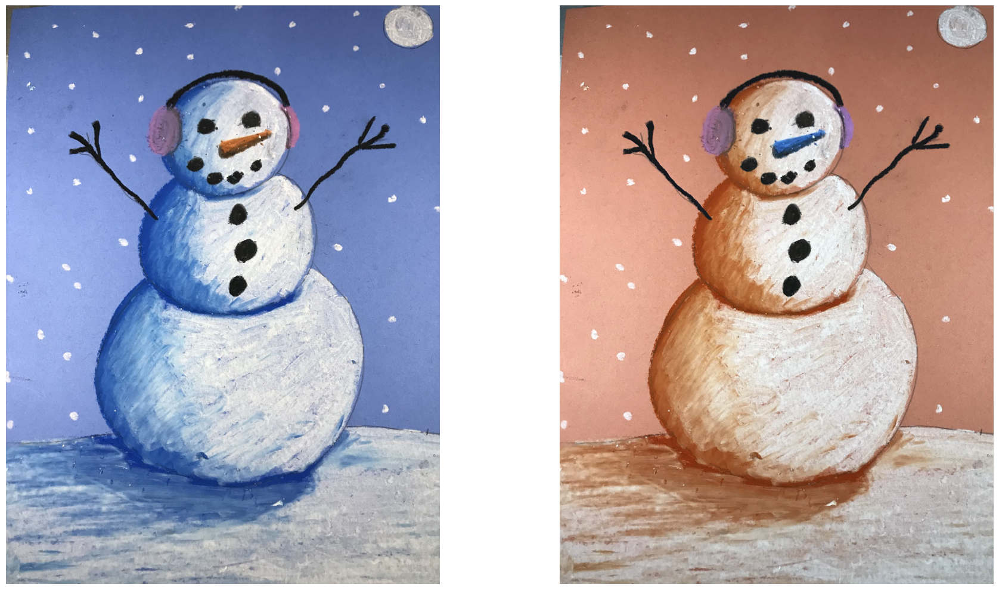

In [193]:
### BEGIN SOLUTION
letters = cv.imread('Images/snowman3.jpg')
letters = cv.cvtColor(letters, cv.COLOR_BGR2RGB)
plot_image(letters)

filter_value = 50

image_filtered = letters.copy()
image_filtered[letters[:,:,0] > filter_value] = [0,255,0]
image_filtered[letters[:,:,1] > filter_value] = [0,255,0]
image_filtered[letters[:,:,2] > filter_value] = [0,255,0]

plot_images(letters, image_filtered)

letters2 = cv.imread('Images/fire.jpg')
letters2 = cv.cvtColor(letters, cv.COLOR_BGR2RGB)
letters2 = letters2[:letters.shape[0], :letters.shape[1]]


image_filtered = letters.copy()
filter = letters[:,:,2] > filter_value
filter2 = letters[:,:,1] > filter_value
filter3 = letters[:,:,0] > filter_value

image_filtered[filter] = letters2[filter]
image_filtered[filter2] = letters2[filter2]
image_filtered[filter3] = letters2[filter3]

plot_images(letters, image_filtered)

### END SOLUTION

## Thresholding Based on Binning
Another technique where thresholding can be applied is based on binning the colors.

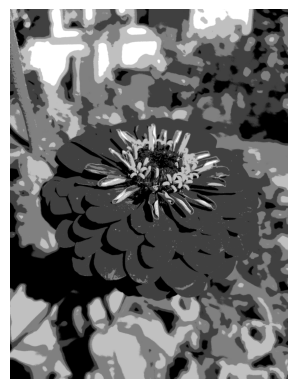

In [195]:
### BEGIN SOLUTION
num_bins = 6
### END SOLUTION

image = cv.imread('Images/flower_2.jpg', cv.IMREAD_GRAYSCALE)
bins = np.linspace(0,255, num_bins)
image_copy = image.copy()
for bin in reversed(bins):
    image_copy[image < bin] = bin

plot_image(image_copy)

#### <font color='blue'>Exercise:</font>
* Explore different numbers of bins.
* Change the colors of the different bins.
* How could a similar method look like for three color channels?


# Morphological Operations
Morphological operations are a set of image processing techniques used to manipulate the shape and structure of objects in digital images. These operations includ **erosion, dilation, opening, closing**, and more. They work by applying a small kernel or structuring element to the image, similar as we did in the previous deep dive.
Commonly morphological operations are employed in tasks like noise reduction, object segmentation, and feature extraction in computer vision and image analysis applications. These operations are often used in segmentation masks.

In the following we will first look at *erosion* and *dilation* before switching to *opening* and *closing*. For this we will only look at binary images and start by using the following binary image:

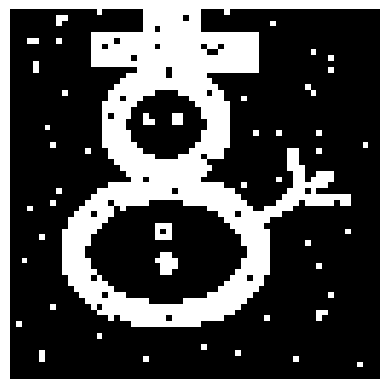

In [199]:
image = cv.imread('Images/pixel_snowman.png', cv.IMREAD_GRAYSCALE)
plot_image(image)

#### <font color='blue'>Exercise:</font>
* what possible interfering factors do you observe in the image?

We will correct these problems using morphological operations. We start by looking on **Dilation** and **Erosion**.

## Dilation (Vergroesserung)
The dilation is defined as:
$$ I \oplus H = \{ (p+q) \quad\textrm{|}\quad \forall {p \in I \quad\textrm{and}\quad q \in H}\}$$
where $I$ is the given image and $H$ is the kernel. 
$I$ as well as $H$ are like sets of white points. 

Based on the set notation, a visual example of the dilation is given in the following picture:

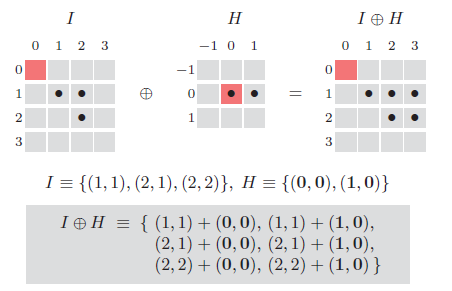 [Source](https://spaces.technik.fhnw.ch/lernmaterialien/website/digitale-bildverarbeitung-eine-algorithmische-einfuehrung-mit-java-bb15)

Let's apply dilation to our snowman image to figure out what happens:

H=array([[0, 1, 0],
       [1, 0, 1],
       [0, 1, 0]], dtype=uint8)


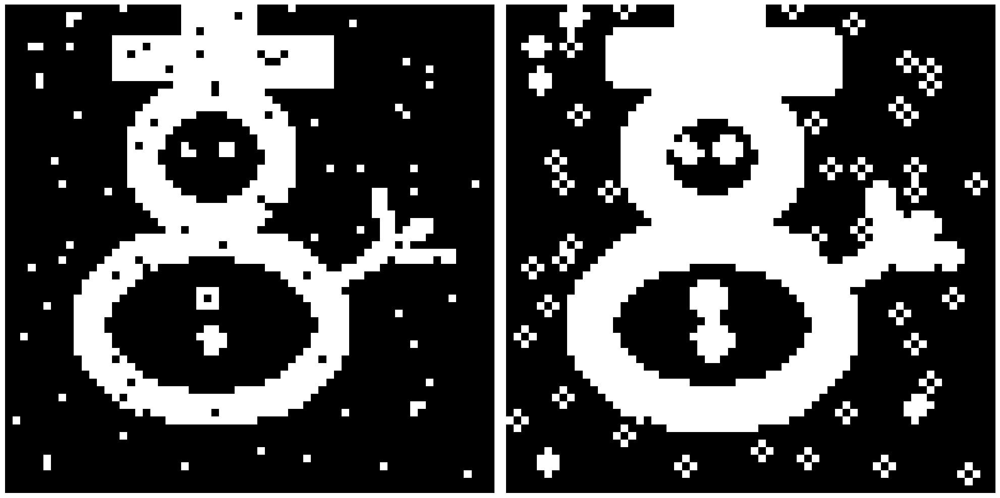

In [216]:
### BEGIN SOLUTION
H = np.zeros((3, 3), np.uint8)
H[1,2] = 1
H[1,0] = 1
H[0,1] = 1
H[2,1] = 1

print(f"{H=}")
### END SOLUTION

img_dilation = cv.dilate(image, H, iterations=1) 
plot_images(image, img_dilation) 

#### <font color='blue'>Exercise:</font>
* What happenes by applying dilation?
    - the snowman gets bigger
* How does the dilation process change when we modify the kernel?
* Which kernel $
$H, can be used to create snowflakes (denoted as small x) through the process of dilatio? 

## Erosion
The erosion is defined as: 
$$ I \ominus  H = \{p \in \mathbb{Z} | (p+q) \in I, \forall q \in H\}$$
where $I$ is the given image and $H$ is the kernel. 

Based on the set notation, a visual example of the erosion is given in the following picture:

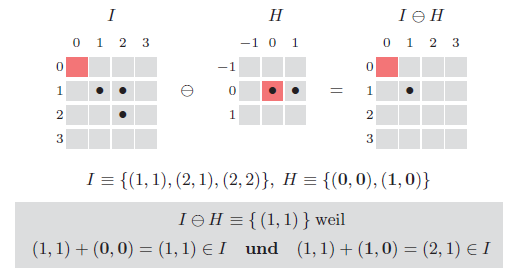 [Source](https://spaces.technik.fhnw.ch/lernmaterialien/website/digitale-bildverarbeitung-eine-algorithmische-einfuehrung-mit-java-bb15)

Let's also apply erosion on the image and see what happens.

H=array([[0, 1, 0],
       [1, 1, 1],
       [0, 1, 0]], dtype=uint8)


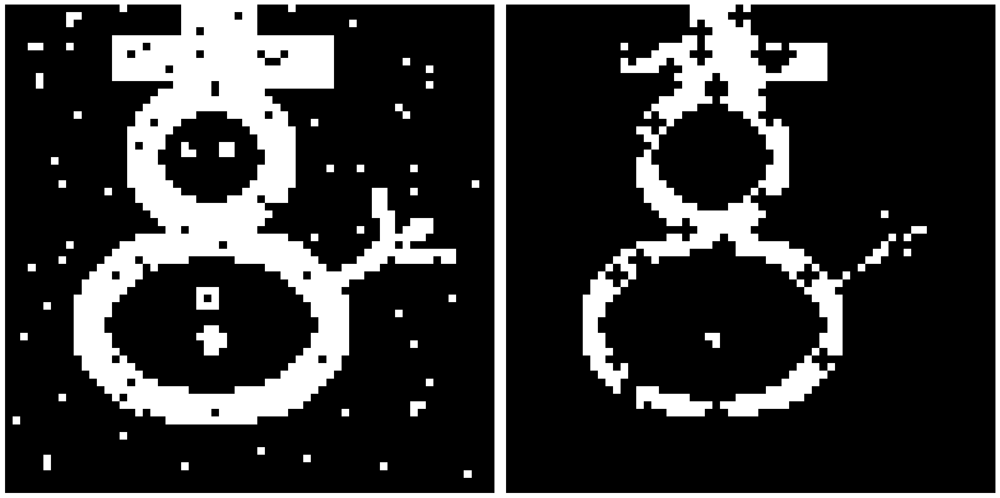

In [231]:
### BEGIN SOLUTION
H = np.zeros((3, 3), np.uint8)
H[1,1] = 1
H[1,0] = 1
H[1,2] = 1
H[0,1] = 1
H[2,1] = 1
print(f"{H=}")
### END SOLUTION
img_erosion = cv.erode(image, H, iterations=1) 
   
plot_images(image, img_erosion) 

#### <font color='blue'>Exercise:</font>
* What happenes by applying erode?
* How does the erode process change when we modify the kernel?


### Design of Morphological Kernels
The design of the morphological filter is tailored to the specific goal of an application. It varies based on the filter operation used (whether dilation or erosion) as well as the size of structures within the image and the nature of the image itself.

Commonly, disc-shaped kernels with defined radius $r$ are used as given in following image, where (a) presents a 4 neighborhood, (b) a 8 neighborhood and (c) a small disk.

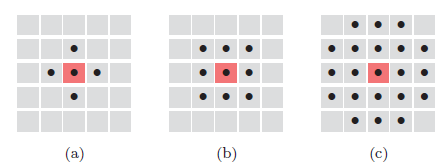 [Source](https://spaces.technik.fhnw.ch/lernmaterialien/website/digitale-bildverarbeitung-eine-algorithmische-einfuehrung-mit-java-bb15)

#### <font color='blue'>Exercise:</font>
Create an own binary images with tools such as [pixilart](https://www.pixilart.com/draw), paint or similar tools and observe what happens to your own image when applying dilation and erostion. Try to apply varrying kernels with different shapes.

## Opening & Closing
Opening and closing represent combinations of erosion and dilation.

**Opening**: Erosion followed by dilation. By applying erosion all smaller structures will be removed and with the dilation the remaining structures will be smoothed and grow to their original size.

$$ I \circ H = (I \ominus  H) \oplus H$$

**Closing**: Dilation followed by erosion. By applying dilation first holes and spaces of the structures are filled by growing of the structures and then the figure will be reduced in size again by applying erosion. 

$$ I \bullet H = (I \oplus  H) \ominus H$$

Let's try that out!

#### <font color='blue'>Exercise:</font>
- Try to remove on the image ```pixel_boxes.png``` only the smallest boxes.
- Try to remove on the image ```pixel_boxes.png``` all boxes except the biggest two boxes.
- Try to fill the missing pixels on the image ```pixel_boxes_2.png```. Is it possible for all boxes?
- What happens when applying opening or closing multiple times?

H=array([[1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1]], dtype=uint8)


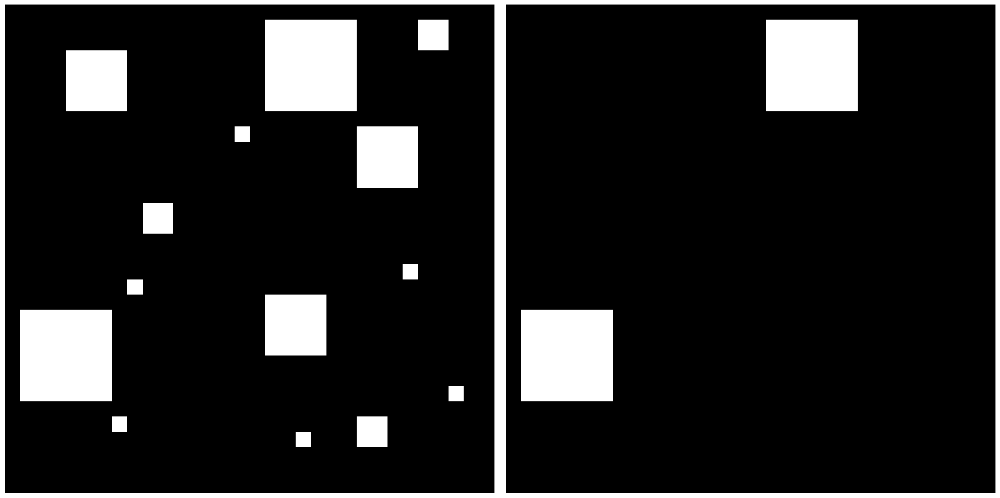

In [284]:
image = cv.imread('Images/pixel_boxes.png', cv.IMREAD_GRAYSCALE)

### BEGIN SOLUTION
H = np.ones((5 ,5), np.uint8)

print(f"{H=}")
result = cv.erode(image, H, iterations=1) 
result = cv.dilate(img_erosion, H, iterations=1)
### END SOLUTION

plot_images(image, result)

H=array([[0, 0, 0, 0, 0],
       [0, 1, 1, 1, 0],
       [0, 1, 1, 1, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0]], dtype=uint8)


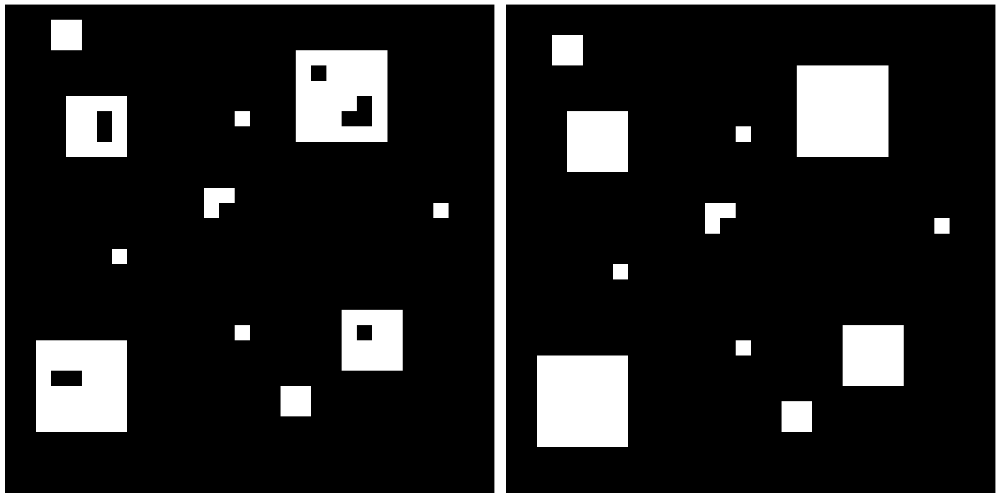

In [290]:
image = cv.imread('Images/pixel_boxes_2.png', cv.IMREAD_GRAYSCALE)

### BEGIN SOLUTION
H = np.zeros((5, 5), np.uint8)
H[1:3, 1:4] = 1


print(f"{H=}")
result = cv.dilate(image, H, iterations=1)
result = cv.erode(result, H, iterations=1)

plot_images(image, result)

## Outline Extraction
In this example, we try to extract the outline of the GBSV handwriting.

#### <font color='blue'>Exercise:</font>
Based on a 4 neighborhood try to find a way to extract the borders of the provided GBSV handwriting.

In [ ]:
image = cv.imread('Images/gbsv.png', cv.IMREAD_GRAYSCALE)
plot_image(image)

In [ ]:
image = cv.imread('Images/gbsv.png', cv.IMREAD_GRAYSCALE)
image = image // 255.0

### BEGIN SOLUTION
H = ... # 4 neighborhood

res = ...

plot_image(res)
### END SOLUTION

## Skeletons & Connected Components
**Skeletonization** is an image processing technique that transforms an binary image into a simplified, one-pixel-wide representation, capturing its essential structure while reducing it to its core skeleton. It is often used in computer vision and pattern recognition for shape analysis, feature extraction, or to find connected components in an image.

In [301]:
def skeletonize(image, plot_result=True):
    assert len(image.shape) == 2 or image.shape[-1] == 1
    skeleton = morphology.skeletonize(image)
    image[skeleton == 1] = 128
    if plot_result:
        plot_images(image, skeleton, titles=['Image With Drawn Skeleton','Skeleton'])
    return skeleton, image

We apply now on the GBSV lettering the skeletonize algorithm:

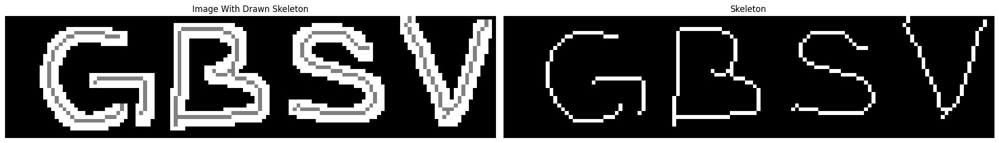

In [302]:
image = cv.imread('Images/gbsv.png', cv.IMREAD_GRAYSCALE)
_ = skeletonize(image)

On the left image the GBSV lettering together with the found skeleton is drawn. We can see that the connectivities and the structures of the letters were preserved. The skeletonization algorithm iteratively erodes away pixels from the boundaries of objects in the image, until they are reduced to a single-pixel wide "skeleton".

Let's look at more complex image examples:

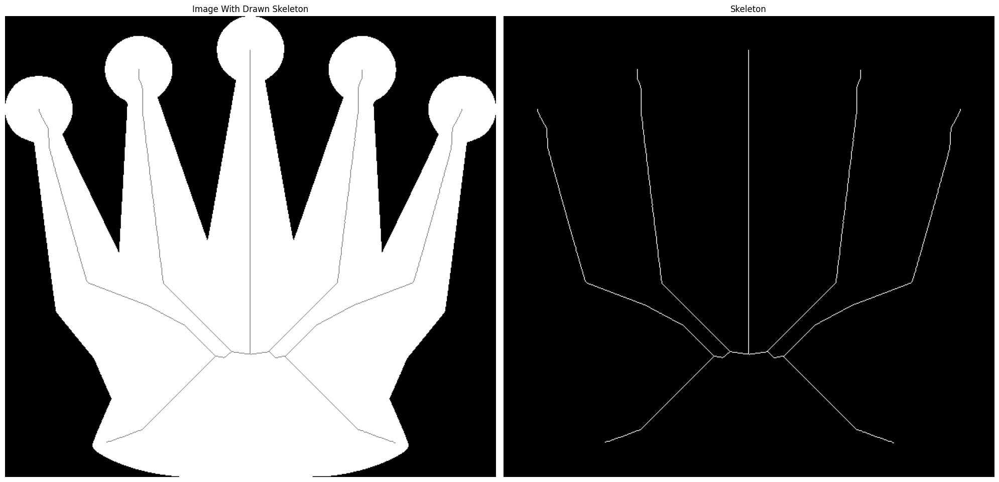

In [303]:
chess = cv.imread('Images/chess.png', cv.IMREAD_GRAYSCALE)
chess = 255-chess
chess[chess > 127] = 255
chess[chess < 128] = 0

_ = skeletonize(chess)

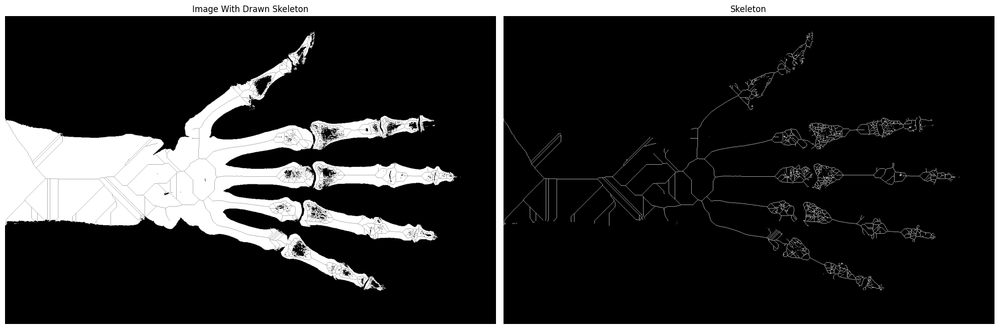

In [294]:
image_hand = cv.imread('Images/hand-xray.jpg', cv.IMREAD_GRAYSCALE) # http://www.symbolforschung.ch/Haende.html
image_hand[image_hand > 127] = 255
image_hand[image_hand < 128] = 0
_ = skeletonize(image_hand)

#### <font color='blue'>Exercise:</font>
* Generate a binary image (for example with [pixilart](https://www.pixilart.com/draw)) containing different shapes (including squares, triangles, etc.). Observe, how the different skeletons look like.

# Keypoints & Feature Descriptors
So far we saw in this and the previous deep dive many different methods for the manipulation and analysis of signals and images.
Unfortunately, what so far is not possible with the provided tools is the comparison of two images to see whether an object is available in both images.

In order to be able to do this, first we need to introduce the two terms *keypoints* and *features*, that are closely related to each other:

**Keypoints**
By a keypoint a specific point and position in the image is designated. This keypoint is robust against lighting, scaling, rotation and other changes.
Algorithms like SIFT (Scale Invariant Feature Transform), SURF (Speeded-Up Robust Features) und FAST (Features from Accelerated Segment Test) are commonly used to extract keypoints from an image.

**Features**
Features are the addition of the keypoints and provide information and description to it.
This information can be in the form of a vector and can contain description like intensity, color, textures and other visual characteristics of and around the keypoint.

By the help of features, keypoints can be compared to each other what helps us comparing two similar images or finding objects in images.




#### <font color='blue'>Exercise:</font>
Research in groups of 3 one of the following methods: 

* FRERAK
* AKAZE
* BRISK
* ORB
* HoG

Present this method in 1-2 slides to the others.

In the following we go deeper into the algorithm **SIFT**.

## SIFT
SIFT is a common algorithm for the localization of interesting image points. SIFT uses for this the concept of "scale space" which helps to localize things over different image resolutions and makes it robust against size changes of objects and images. 

SIFT can be used to track objects over multiple frames although the object is approaching the camera or images with different sizes can be stiched to form for example a panorama.

The calculation of this SIFT-algorithm is splitted up in the following four steps:

1. **Scale-space Extrema Detection:** Identify potential keypoints by looking for local extrema in the difference of Gaussian (DoG) images, which are created by applying Gaussian blurring at multiple scales.

2. **Keypoint Localization:** Precisely locate keypoints by fitting a 2D quadratic function to the DoG function to determine their position and scale accurately.

3. **Orientation Assignment:** Assign a dominant orientation to each keypoint based on gradient information to ensure rotation invariance.

4. **Keypoint Descriptor:** Construct a descriptor that encodes gradient information in the region around each keypoint, making it invariant to scale, rotation, and partly to illumination changes.

5. **Keypoint Matchinig:** Match keypoints between images by comparing their descriptors, typically using nearest-neighbor matching with a distance metric. These matches are used in applications like object recognition and image stitching.

In general the SIFT algorithm is a very complexe algorithm with a lot of coordinated steps and different parameters.
Due to this we will use the implementation of OpenCV in this deep dive.

Now let's try out the SIFT algorithm provided by OpenCV on an image from our campus!

In [295]:
def create_SIFT(img: np.ndarray, gray_img: np.ndarray) -> np.ndarray:
    img = img.copy()
    gray_img = gray_img.copy()
    sift = cv.SIFT_create()
    kp, des = sift.detectAndCompute(gray_img,None)
    img_ = cv.drawKeypoints(gray_img,kp,img)#, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    return img_, kp, des

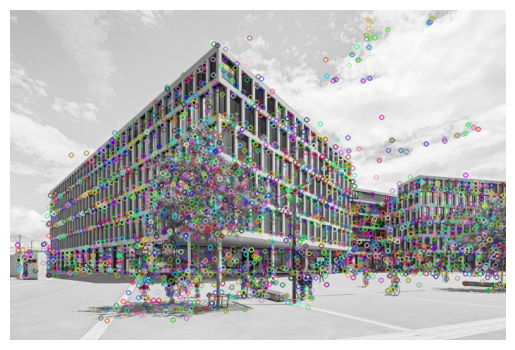

In [296]:
img = cv.imread('Images/FHNW.png')
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
img_sift, kp, des = create_SIFT(img, gray)
plot_image(img_sift)

#### <font color='blue'>Exercise:</font>
* What is drawn on the image?
* In the variable ```des``` the features are saved and in ```kp``` the keypoints:
  * How many keypoints were found?
      * Does the number of keypoints change when changing the image?
  * How many features does each keypoint has?
      * Is this always the same?
  * Where in the image are the keypoints located?

In the following we rotate the same image and look how the keypoints found will change:

In [297]:
def rotate_image(img: np.ndarray, angle: int) -> np.ndarray:
    # Calculate the rotation matrix
    height, width = img.shape[:2]
    center = (width // 2, height // 2)
    rotation_matrix = cv.getRotationMatrix2D(center, angle, 1.0)
    
    # Apply the rotation to the image
    rotated_image = cv.warpAffine(img, rotation_matrix, (width, height))
    return rotated_image

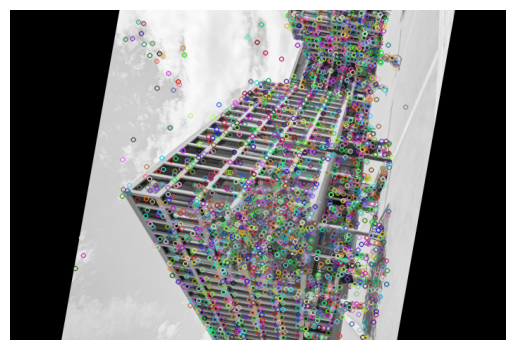

In [298]:
img_rotated = rotate_image(img, 80)
gray_rotated = rotate_image(gray, 80)
img_sift_rotated, kp_rotated, des_rotated = create_SIFT(img_rotated, gray_rotated)
plot_image(img_sift_rotated)

#### <font color='blue'>Exercise:</font>
* How does the location of the keypoints change due to the rotation?
* How many keypoints were now recognized?

--------------------

### Matching with Keypoints
In the following we try to two match the FHNW building with the rotated FHNW building based on the before extracted keypoints.

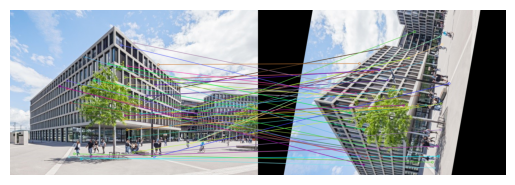

In [299]:
# Match Keypoints
bf = cv.BFMatcher(cv.NORM_L1, crossCheck=True) # Für SIFT NORM_L1 oder NORM_L2 verwenden.

matches = bf.match(des, des_rotated)
matches = sorted(matches, key=lambda x: x.distance)

img3 = cv.drawMatches(img, kp, img_rotated, kp_rotated, matches[:50], img_rotated, flags=2)
plot_image(img3)

Now you can try to match your own images!

#### <font color='blue'>Exercise:</font>
* Try the following two tasks and figure out the goodness of the SIFT algorithm:
    * Select an image and crop out a small object of the image. Try to match these two images with each other.
    * Select an object and make 2 photos from different angles. Try to match these two images with each other.

* Try to use a different feature extraction algorithm for the two tasks above, e.g. BRISK

**Tip:** *Try to use the following methods to achieve better results:*
   * Resizing of the image
   * Apply suitable filters (Deep Dive 1)


**General Questions:**
   * What is a good number of keypoints?
   * What are problems that can occure when matching images?


In [300]:
class key_point_extractor(Enum):
    SIFT = 1
    BRISK = 2

def create_brisk(img: np.ndarray, gray_img: np.ndarray) -> np.ndarray:
    ### BEGIN SOLUTION
    ...
    ### END SOLUTION

def key_point_and_match(img_1: np.ndarray, img_2: np.ndarray, key_point_extractor: key_point_extractor, matching_points: int = 50):
    gray_1 = cv.cvtColor(img_1, cv.COLOR_BGR2GRAY)
    gray_2 = cv.cvtColor(img_2, cv.COLOR_BGR2GRAY)

    ### BEGIN SOLUTION    
    ...
    ### END SOLUTION
    # Plot images
    plot_images(img_1_res, img_2_res, titles=["Image 1", "Image 2"])
    plot_image(cv.drawMatches(img_1, kp_1, img_2, kp_2, matches[:matching_points], img_1, flags=2))